In [22]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pymc as pm
import seaborn as sns
from scipy import stats

%config InlineBackend.figure_format = 'retina'
RANDOM_SEED = 8927
np.random.seed(286)

In [2]:
az.style.use("arviz-darkgrid")

# Chapter 4 - Inferences with Gaussians
## 4.1 Inferring a mean and standard deviation


Inferring the mean and variance of a Gaussian distribution. 
$$ \mu \sim \text{Gaussian}(0, .001)  $$
$$ \sigma \sim \text{Uniform} (0, 10)  $$
$$ x_{i} \sim \text{Gaussian} (\mu, \frac{1}{\sigma^2})  $$


In [6]:
# Data
x = np.array([1.1, 1.9, 2.3, 1.8])
n = len(x)

with pm.Model() as model1:
    # prior
    mu = pm.Normal("mu", mu=0., tau=0.001) # here tau is precision; if sigma is given, tau is no longer needed
    sigma = pm.Uniform("sigma", lower=0., upper=10.)
    # observed
    xi = pm.Normal("xi", mu=mu, tau=1 / (sigma ** 2), observed=x)
    # inference
    trace1 = pm.sample(2000, tune=2000, target_accept=0.9)

# idata1 = az.from_pymc3(trace1)
az.summary(trace1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 30 seconds.
There were 17 divergences after tuning. Increase `target_accept` or reparameterize.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,1.805,0.707,0.518,2.923,0.029,0.020,848.0,697.0,1.01
sigma,1.029,0.946,0.241,2.464,0.033,0.023,1108.0,1063.0,1.00


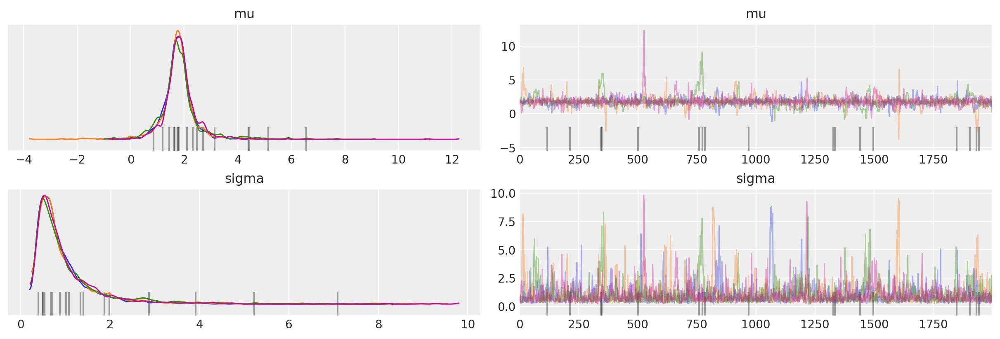

In [7]:
az.plot_trace(trace1, compact=False);

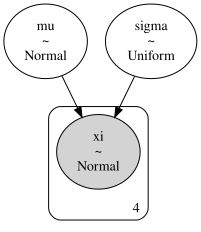

In [12]:
pm.model_to_graphviz(model1)

array([[<Axes: >, None],
       [<Axes: xlabel='mu', ylabel='sigma'>, <Axes: >]], dtype=object)

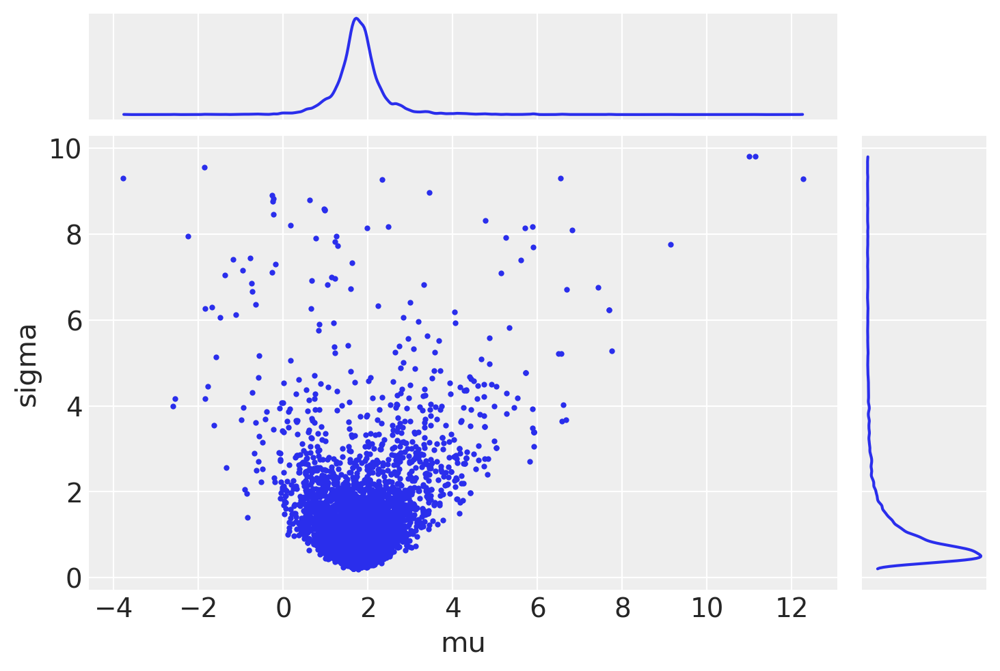

In [21]:
# az.plot_joint(trace1, joint_kwargs={"alpha": 0.2}); 
# this will return an error, maybe because "plot_joint" is now deprecated

# this is the new way to plot joint distribution
az.plot_pair(trace1, marginals=True, kind='scatter')

/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/seaborn/axisgrid.py:1766: UserWarning: The figure layout has changed to tight
  f.tight_layout()


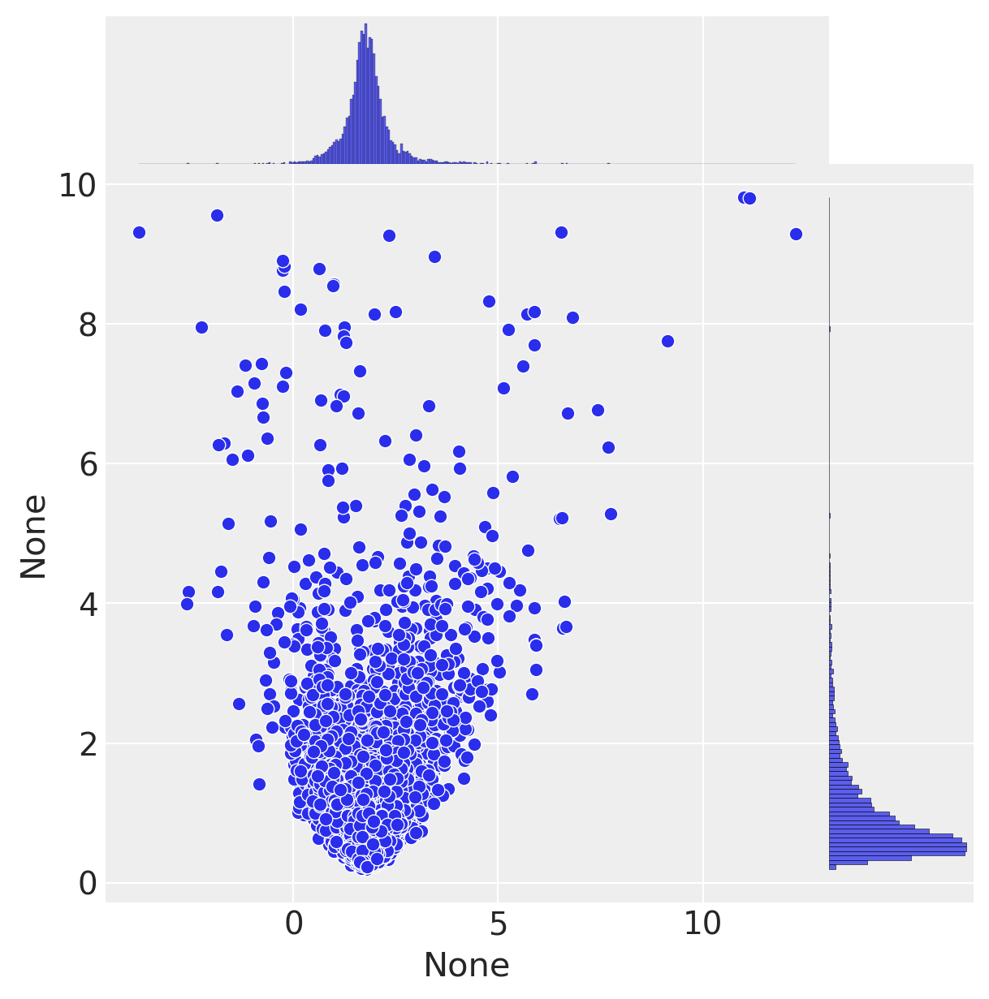

In [17]:
# another way is using seaborn:
# But the code below is leaving out many details; 
#   not recommended compared to az.plot_pair

sns.jointplot(x=trace1.posterior["mu"].to_numpy().flatten(),
              y=trace1.posterior["sigma"].to_numpy().flatten(),
              kind="scatter", space=0, color="C0");

### Note from Junpeng Lao
There might be divergence warning (Uniform prior on sigma is not a good idea in general), which you can further visualize below:

/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


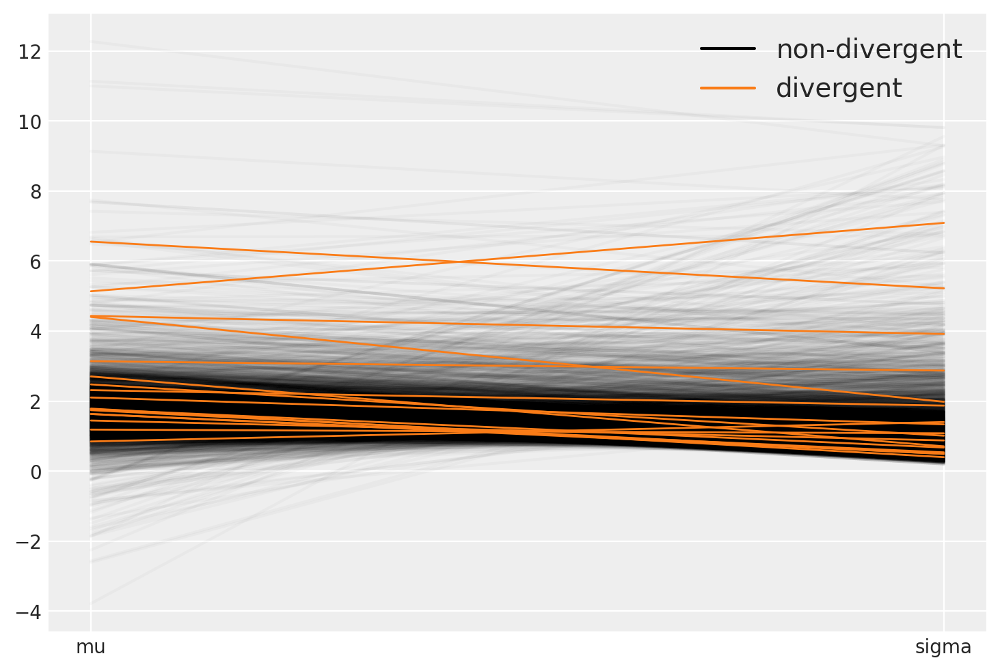

In [22]:
az.plot_parallel(trace1);

### Exercises

#### Exercise 4.1.1

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 30 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,4.006,0.509,3.037,4.930,0.007,0.005,5880.0,4972.0,1.0
sigma,2.296,0.403,1.631,3.067,0.006,0.004,5041.0,4263.0,1.0


array([[<Axes: >, None],
       [<Axes: xlabel='mu', ylabel='sigma'>, <Axes: >]], dtype=object)

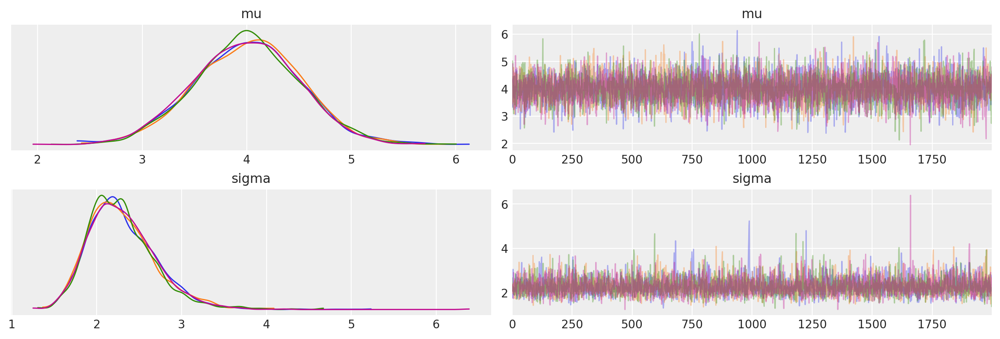

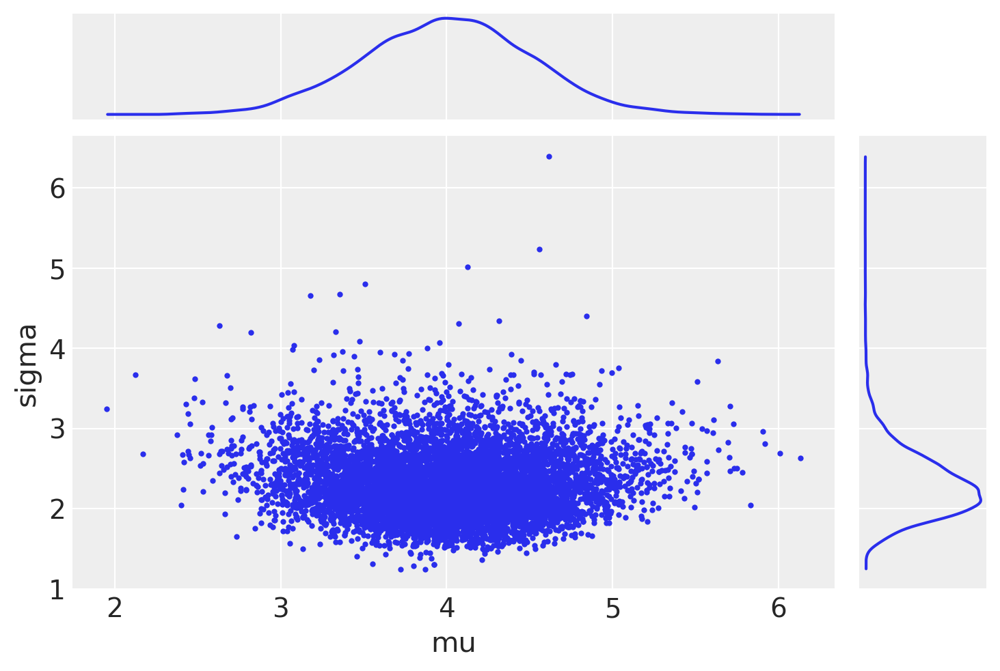

In [27]:
x = np.array([1.1, 1.9, 2.3, 1.8,
              2.2, 2.8, 3.1, 2.7,
                3.0, 3.5, 3.9, 3.6,
                3.8, 4.3, 4.7, 4.4,
                7.1, 7.9, 8.3, 7.8])
n = len(x)

with pm.Model() as model1_1:
    # prior
    mu = pm.Normal("mu", mu=0., tau=0.001) # here tau is precision; if sigma is given, tau is no longer needed
    sigma = pm.Uniform("sigma", lower=0., upper=10.)
    # observed
    xi = pm.Normal("xi", mu=mu, tau=1 / (sigma ** 2), observed=x)
    # inference
    trace1_1 = pm.sample(2000, tune=2000, target_accept=0.9)
    
display(az.summary(trace1_1))

az.plot_trace(trace1_1, compact=False);

az.plot_pair(trace1_1, marginals=True, kind='scatter')
                

In [28]:
x.mean(), x.std() 
# so the expectation of estimated mean and std is close to those computed from the samples

(4.01, 2.0937764923697086)

In [30]:
display(az.summary(trace1_1))

# in the example given in the book, the sd of mu and sigma are ~0.71 and ~0.95, respectively
# In this example, we change x to more samples (although they are more diverse), 
#   the sd of mu and sigma get smaller

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,4.006,0.509,3.037,4.930,0.007,0.005,5880.0,4972.0,1.0
sigma,2.296,0.403,1.631,3.067,0.006,0.004,5041.0,4263.0,1.0


#### Exercise 4.1.2

This is already plotted in the main chapeter. 

We can see that, when sigma is small, mu is also very concentrated. When sigma is large, mu is more spread out.

#### Exercise 4.1.3

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 26 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,1.778,0.493,0.833,2.68,0.009,0.006,2941.0,4469.0,1.0


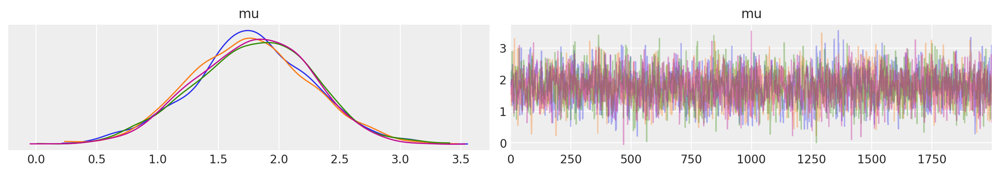

In [33]:
x = np.array([1.1, 1.9, 2.3, 1.8])
n = len(x)

with pm.Model() as model1_3:
    # prior
    mu = pm.Normal("mu", mu=0., tau=0.001)
    sigma = 1
    # observed
    xi = pm.Normal("xi", mu=mu, tau=1 / (sigma ** 2), observed=x)
    # inference
    trace1_3 = pm.sample(2000, tune=2000, target_accept=0.9)
    
az.plot_trace(trace1_3, compact=False);

az.summary(trace1_3)

In [36]:
x.mean(), x.std()
# although x's std is not 1, 
#   the estimated mu is close to the sample mean

(1.775, 0.4322904116447645)

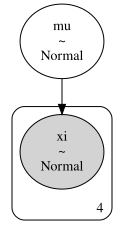

In [37]:
pm.model_to_graphviz(model1_3)

#### Exercise 4.1.4

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 26 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.704,0.478,0.23,1.443,0.012,0.01,1996.0,2321.0,1.0


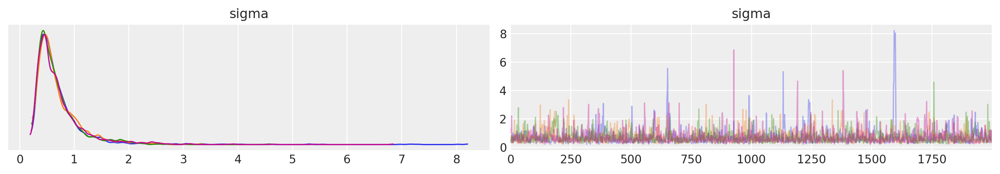

In [40]:
x = np.array([1.1, 1.9, 2.3, 1.8]) # x.mean() = 1.775
n = len(x)

with pm.Model() as model1_4:
    # prior
    mu = 1.7
    sigma = pm.Uniform("sigma", lower=0., upper=10.)
    # observed
    xi = pm.Normal("xi", mu=mu, tau=1 / (sigma ** 2), observed=x)
    # inference
    trace1_4 = pm.sample(2000, tune=2000, target_accept=0.9)
    
az.plot_trace(trace1_4, compact=False);

display(az.summary(trace1_4))

In [45]:
x.mean(), x.std()

(1.775, 0.4322904116447645)

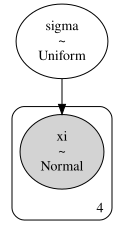

In [41]:
pm.model_to_graphviz(model1_4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 29 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.706,0.473,0.219,1.42,0.012,0.009,1880.0,1555.0,1.0


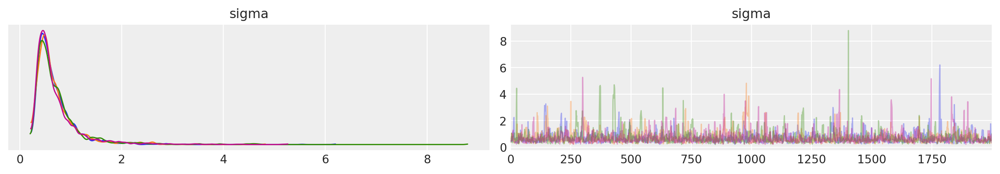

In [51]:
x = np.array([1.1, 1.9, 2.3, 1.8]) # x.mean() = 1.775
n = len(x)

with pm.Model() as model1_4:
    # prior
    mu = 1.7
    sigma = pm.Uniform("sigma", lower=0., upper=10.) # posterior sigma mean is around 0.706
    #### try other priors
    # sigma = pm.Uniform("sigma", lower=0., upper=2.) # posterior sigma mean is around 0.6
    # sigma = pm.Uniform("sigma", lower=0., upper=1.) # posterior sigma mean is around 0.554
    # sigma = pm.HalfNormal("sigma", sigma=10.) # posterior sigma mean is around 0.712
    #### so, differnet priors will lead to different results
    
    # observed
    xi = pm.Normal("xi", mu=mu, tau=1 / (sigma ** 2), observed=x)
    # inference
    trace1_4 = pm.sample(2000, tune=2000, target_accept=0.9)
    
az.plot_trace(trace1_4, compact=False);

display(az.summary(trace1_4))

Using the prior distribution Uniform(0, 10) for $\sigma$ is not a good idea, for the above dataset (4 data points), and different priors for $\sigma$ lead to very different results (eg. mean of the posterior distribution of $\sigma$).

But besides the choice of prior, the data size also matters. When we replicate the data more times (so sample mean and sd keep unchanged), the posterior distribution of $\sigma$ will be more concentrated, and closer to sample sd (which is more intuitive). 

See the code below:

1.775 0.43229041164476445


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 31 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.452,0.052,0.36,0.549,0.001,0.001,2832.0,3895.0,1.0


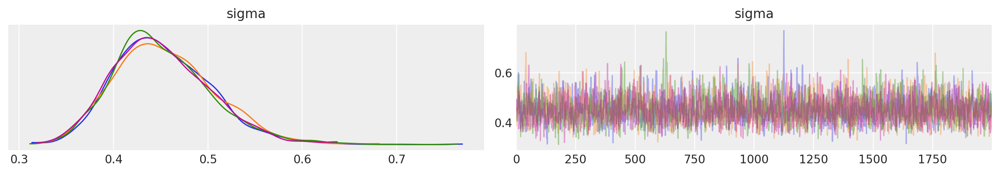

In [52]:
x = np.array([1.1, 1.9, 2.3, 1.8]*10) # x.mean() = 1.775
print(x.mean(), x.std())
n = len(x)

with pm.Model() as model1_4:
    # prior
    mu = 1.7
    sigma = pm.Uniform("sigma", lower=0., upper=10.) # posterior sigma mean is around 0.706
    # observed
    xi = pm.Normal("xi", mu=mu, tau=1 / (sigma ** 2), observed=x)
    # inference
    trace1_4 = pm.sample(2000, tune=2000, target_accept=0.9)
    
az.plot_trace(trace1_4, compact=False);

display(az.summary(trace1_4))

## 4.2 The seven scientists


The model:
$$ \mu \sim \text{Gaussian}(0, .001)  $$
$$ \lambda_{i} \sim \text{Gamma} (.001, .001)  $$
$$ \sigma = 1/{\sqrt\lambda_{i}} $$  
$$ x_{i} \sim \text{Gaussian} (\mu, \lambda_{i})  $$

The mean is the same for all seven scientists, while the standard deviations are different 

In [77]:
# data
x = np.array([-27.020, 3.570, 8.191, 9.898, 9.603, 9.945, 10.056])
n = len(x)

with pm.Model() as model2:
    # prior
    mu = pm.Normal("mu", mu=0., tau=0.001)
    lambda1 = pm.Gamma("lambda1", alpha=0.01, beta=0.01, shape=n)
    sigma = pm.Deterministic('sigma',1 / np.sqrt(lambda1))
    # observed
    xi = pm.Normal("xi", mu=mu, tau=lambda1, observed=x)

    # inference
    trace2 = pm.sample(2000, tune=2000, target_accept=0.9)

az.summary(trace2, stat_funcs={"median": np.median})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, lambda1]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 45 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
mu,9.868,0.205,9.474,10.201,0.004,0.003,3173.0,2788.0,1.0,9.894
lambda1[0],0.001,0.001,0.000,0.003,0.000,0.000,3498.0,1891.0,1.0,0.000
lambda1[1],0.027,0.038,0.000,0.095,0.000,0.000,3881.0,2530.0,1.0,0.012
lambda1[2],0.387,0.641,0.000,1.305,0.008,0.006,3985.0,3200.0,1.0,0.177
lambda1[3],30.788,49.765,0.000,115.667,0.619,0.437,3270.0,2766.0,1.0,11.179
lambda1[4],14.595,27.961,0.000,56.945,0.352,0.249,4287.0,3271.0,1.0,4.712
lambda1[5],30.196,50.357,0.000,116.015,0.628,0.457,3625.0,3366.0,1.0,10.268
lambda1[6],23.955,42.514,0.000,94.824,0.535,0.378,3600.0,2955.0,1.0,7.652
sigma[0],202.175,1425.803,10.488,409.400,31.754,22.456,3498.0,1891.0,1.0,53.125
sigma[1],55.959,1174.039,1.688,72.765,23.404,16.551,3881.0,2530.0,1.0,9.085


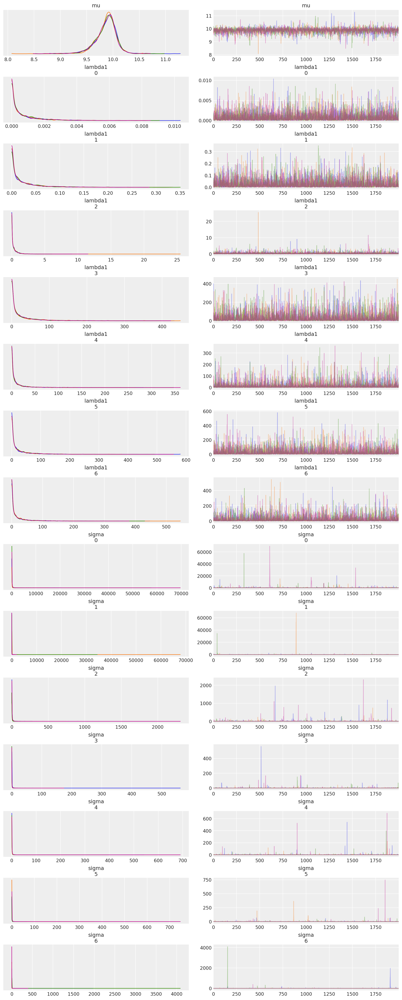

In [78]:
az.plot_trace(trace2, compact=False);

### Exercises

#### Exercise 4.2.1

In [79]:
az.summary(trace2, stat_funcs={"median": np.median})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
mu,9.868,0.205,9.474,10.201,0.004,0.003,3173.0,2788.0,1.0,9.894
lambda1[0],0.001,0.001,0.000,0.003,0.000,0.000,3498.0,1891.0,1.0,0.000
lambda1[1],0.027,0.038,0.000,0.095,0.000,0.000,3881.0,2530.0,1.0,0.012
lambda1[2],0.387,0.641,0.000,1.305,0.008,0.006,3985.0,3200.0,1.0,0.177
lambda1[3],30.788,49.765,0.000,115.667,0.619,0.437,3270.0,2766.0,1.0,11.179
lambda1[4],14.595,27.961,0.000,56.945,0.352,0.249,4287.0,3271.0,1.0,4.712
lambda1[5],30.196,50.357,0.000,116.015,0.628,0.457,3625.0,3366.0,1.0,10.268
lambda1[6],23.955,42.514,0.000,94.824,0.535,0.378,3600.0,2955.0,1.0,7.652
sigma[0],202.175,1425.803,10.488,409.400,31.754,22.456,3498.0,1891.0,1.0,53.125
sigma[1],55.959,1174.039,1.688,72.765,23.404,16.551,3881.0,2530.0,1.0,9.085


~~lambda[0], lambda[1] mean very small, so their measurements are very inaccurate.~~

~~lambda[2] mean is around 0.652; corresponding sd is about (1/0.652)**0.5 = 1.238; so it is relatively accurate.~~

~~The rest have very high lambda mean; so sd very small; the most accurate ones.~~

##### Solution for Reference
> The posterior distributions for most standard deviations are very skewed. As a result, the posterior mean will be dominated by relatively low proportion of extreme values. For this reason, it is more informative to look at the posterior median. As expected, the ﬁrst two scientists are pretty inept measurers and have high estimates of sigma. The third scientist does better than the ﬁrst two, but also appears more inept than the remaining four.

#### Exercise 4.2.2

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 2_000 tune and 2_000 draw iterations (8_000 + 8_000 draws total) took 49 seconds.
There were 444 divergences after tuning. Increase `target_accept` or reparameterize.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
mu,8.485,4.085,0.503,15.680,0.125,0.088,1558.0,1302.0,1.0,9.317
sigma[0],54.826,23.373,19.050,97.021,0.506,0.390,2346.0,1596.0,1.0,52.382
sigma[1],30.509,25.911,0.119,82.875,0.534,0.377,2241.0,2455.0,1.0,21.801
sigma[2],25.252,26.169,0.137,80.620,0.575,0.406,2018.0,2705.0,1.0,14.478
sigma[3],23.843,26.097,0.100,79.535,0.584,0.432,1200.0,982.0,1.0,13.126
sigma[4],23.211,25.478,0.108,77.410,0.578,0.408,1392.0,1518.0,1.0,12.474
sigma[5],23.255,25.704,0.138,78.296,0.535,0.379,663.0,226.0,1.0,12.434
sigma[6],25.033,26.227,0.100,79.067,0.637,0.450,1612.0,2603.0,1.0,14.419
lambda1[0],0.001,0.001,0.000,0.002,0.000,0.000,2346.0,1596.0,1.0,0.000
lambda1[1],0.189,2.775,0.000,0.093,0.097,0.070,2241.0,2455.0,1.0,0.002


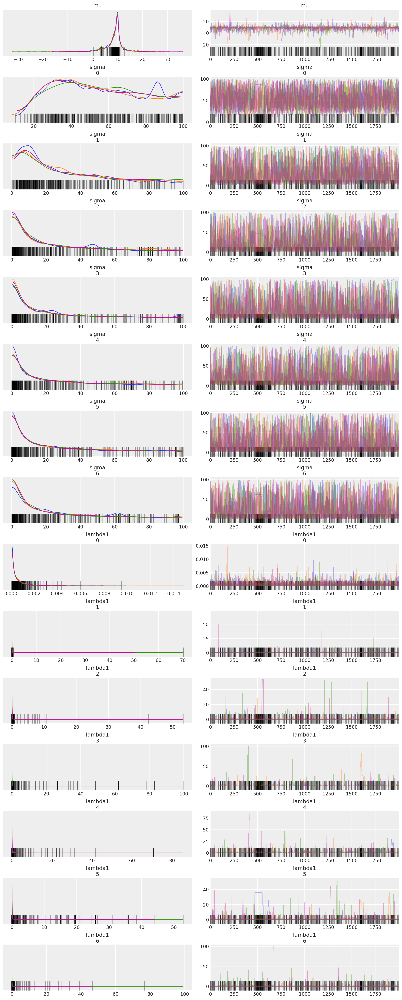

In [76]:
# data
x = np.array([-27.020, 3.570, 8.191, 9.898, 9.603, 9.945, 10.056])
n = len(x)

with pm.Model() as model2_2:
    # prior
    mu = pm.Normal("mu", mu=0., tau=0.001)
    sigma = pm.Uniform("sigma", lower=0., upper=100., shape=n)
    lambda1 = pm.Deterministic("lambda1", 1 / (sigma ** 2))
    # observed
    xi = pm.Normal("xi", mu=mu, tau=lambda1, observed=x)
    # inference
    trace2_2 = pm.sample(2000, tune=2000, target_accept=0.9)

display(az.summary(trace2_2, stat_funcs={"median": np.median}))

az.plot_trace(trace2_2, compact=False);

    the diﬀerence between the scientists is reduced. (So choosing an appropriate prior is important.)

## 4.3 Repeated measurement of IQ


The model:
$$ \mu_{i} \sim \text{Uniform}(0, 300)  $$
$$ \sigma \sim \text{Uniform} (0, 100)  $$
$$ x_{ij} \sim \text{Gaussian} (\mu_{i}, \frac{1}{\sigma^2})  $$

Data Come From Gaussians With Different Means But Common Precision

In [4]:
# Data
y = np.array([[90, 95, 100], [105, 110, 115], [150, 155, 160]])
ntest = 3
nsbj = 3

with pm.Model() as model3:
    # mu_i ~ Uniform(0, 300)
    # notices the shape here need to be properly
    # initualized to have the right repeated measure
    mui = pm.Uniform("mui", 0., 300., shape=(nsbj, 1)) # shape = (3, 1)

    # sg ~ Uniform(0, 100)
    # sg = pm.Uniform('sg', .0, 100)

    # It is more stable to use a Gamma prior
    lambda1 = pm.Gamma("lambda1", alpha=0.01, beta=0.01)
    sg = pm.Deterministic("sg", 1 / np.sqrt(lambda1))

    # y ~ Normal(mu_i, sg)
    yd = pm.Normal("y", mu=mui, sigma=sg, observed=y)

    trace3 = pm.sample(init="adapt_diag")

az.summary(trace3, stat_funcs={"median": np.median})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mui, lambda1]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 32 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
"mui[0, 0]",94.991,3.594,88.495,102.302,0.059,0.042,3647.0,2572.0,1.0,95.032
"mui[1, 0]",110.018,3.603,102.847,116.310,0.065,0.047,3386.0,2267.0,1.0,110.015
"mui[2, 0]",154.973,3.917,148.279,161.834,0.077,0.054,3042.0,1928.0,1.0,155.018
lambda1,0.039,0.023,0.005,0.080,0.000,0.000,1836.0,1943.0,1.0,0.036
sg,5.822,2.186,2.841,9.637,0.055,0.039,1836.0,1943.0,1.0,5.299


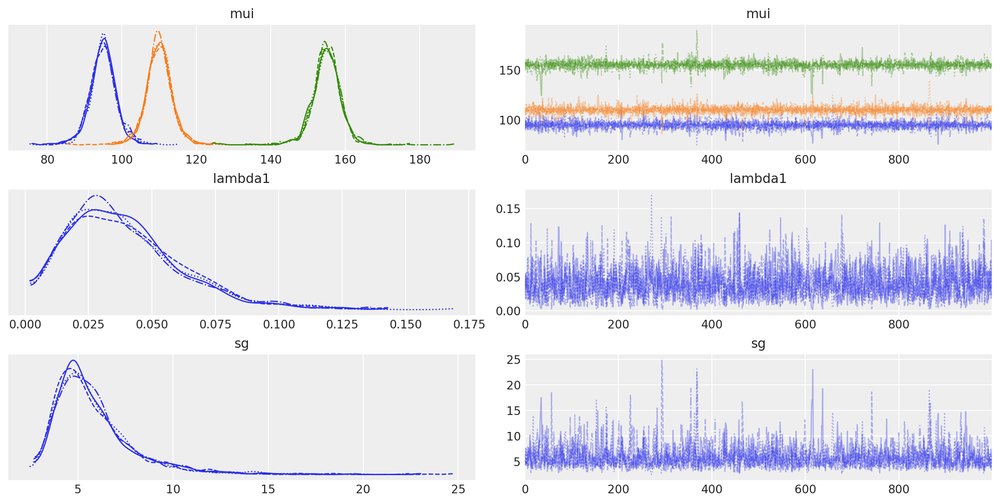

In [11]:
az.plot_trace(trace3, compact=True);

### Exercises

#### Exercise 4.3.1

The three persons' IQs are about 95, 110, 155. 

As is shown above, the standard deviation of the posterior distribution of $\sigma$ is about 5 (using median).

At least it is enough to distinguish the three persons' IQs.

#### Exercise 4.3.2

Using a Normal Distribution (with $\mu_{Normal} = 100, \sigma_{Normal} = 15$) as the prior for $\mu$.

In [13]:
# Data
y = np.array([[90, 95, 100], [105, 110, 115], [150, 155, 160]])
ntest = 3
nsbj = 3

with pm.Model() as model3:
    # mu_i ~ Uniform(0, 300)
    # notices the shape here need to be properly
    # initualized to have the right repeated measure
    mui = pm.Normal("mui", mu=100., sigma=15., shape=(nsbj, 1)) # shape = (3, 1)

    # sg ~ Uniform(0, 100)
    # sg = pm.Uniform('sg', .0, 100)

    # It is more stable to use a Gamma prior
    lambda1 = pm.Gamma("lambda1", alpha=0.01, beta=0.01)
    sg = pm.Deterministic("sg", 1 / np.sqrt(lambda1))

    # y ~ Normal(mu_i, sg)
    yd = pm.Normal("y", mu=mui, sigma=sg, observed=y)

    trace3 = pm.sample(init="adapt_diag")

az.summary(trace3, stat_funcs={"median": np.median})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mui, lambda1]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
"mui[0, 0]",95.381,3.574,88.298,102.126,0.071,0.051,2611.0,1943.0,1.0,95.331
"mui[1, 0]",109.396,3.661,102.740,116.676,0.074,0.052,2707.0,1518.0,1.0,109.575
"mui[2, 0]",151.806,4.750,144.081,159.413,0.135,0.096,1986.0,1141.0,1.0,152.480
lambda1,0.037,0.023,0.004,0.078,0.001,0.000,1050.0,1092.0,1.0,0.033
sg,6.195,2.763,2.706,10.731,0.094,0.066,1050.0,1092.0,1.0,5.529


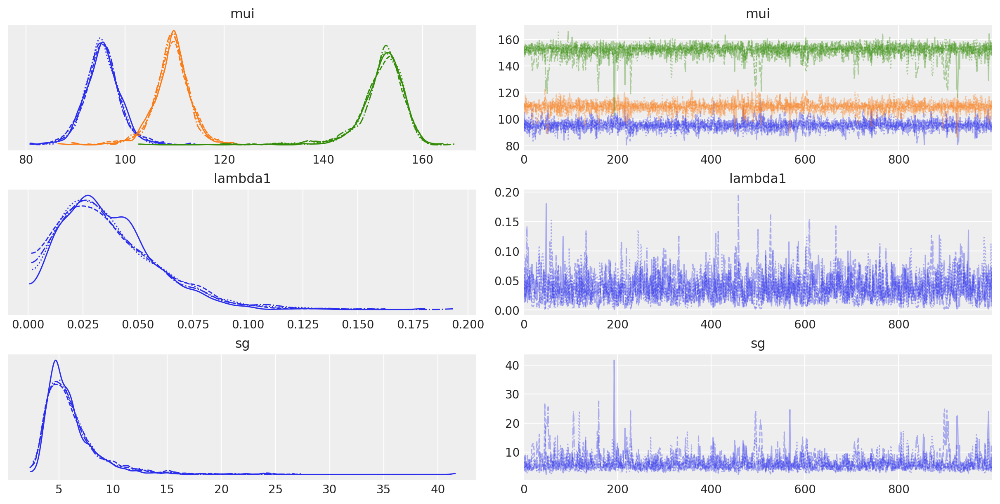

In [14]:
az.plot_trace(trace3, compact=True);

Sigma's mean, sd, median all become larger.

Person 3's IQ estimate becomes lower (mean 154.97 => 151.806). This is because his IQ may be inherently higher than others (even to an extreme value). After we change the prior for $\mu$ from a uniform distribution to a normal distribution, the prior probability of such extreme values decreases, so the posterior estimate of his IQ decreases.

Solution for Reference:
> The same strong eﬀect of the prior on inference is not evident for the other people, because their IQ scores have values over a range for which the prior is (relatively) ﬂat.

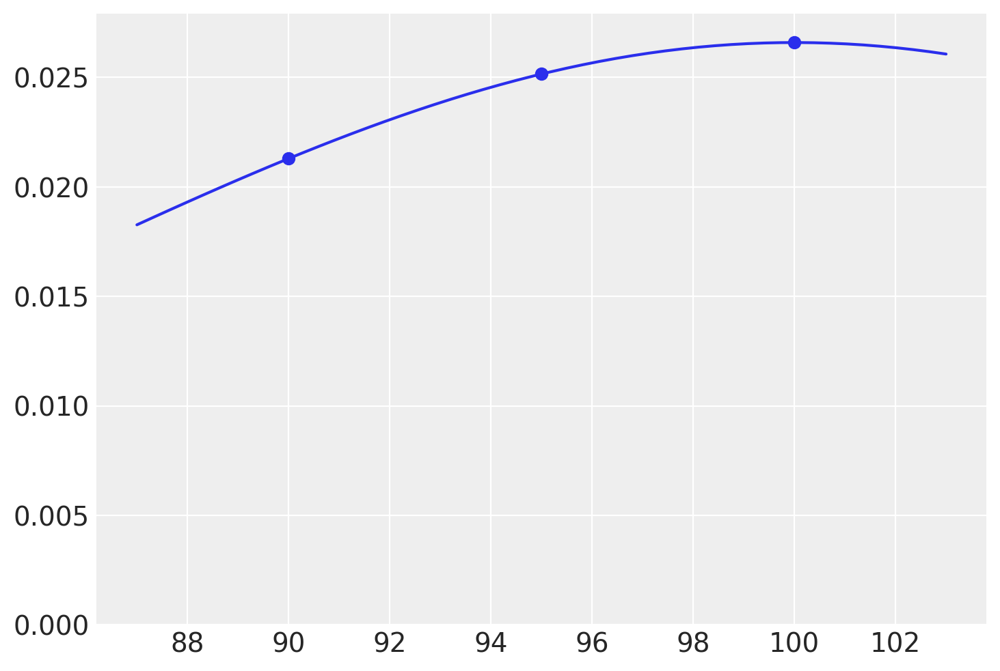

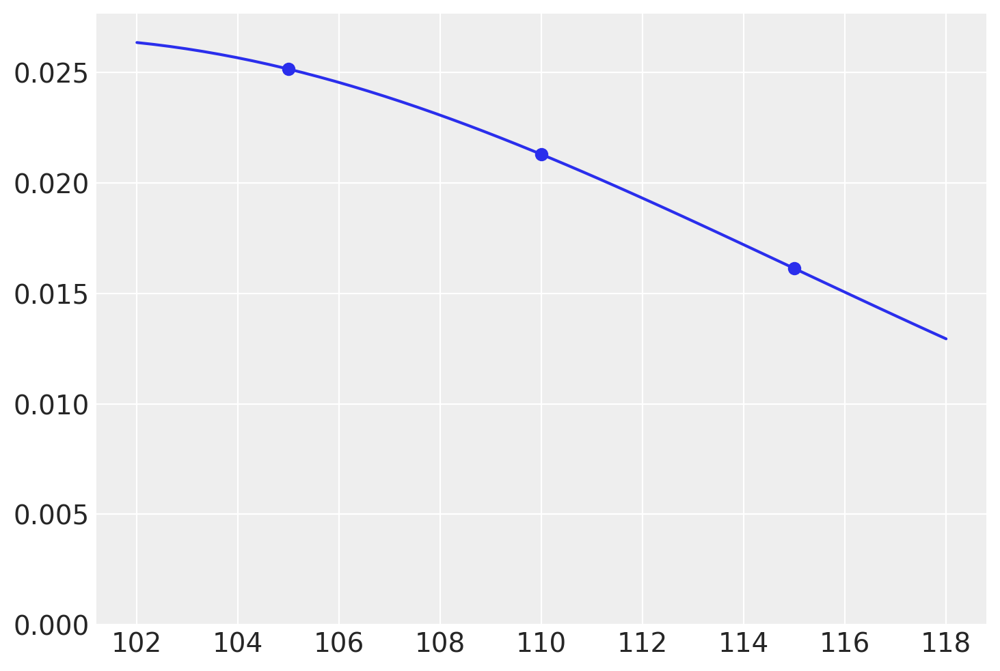

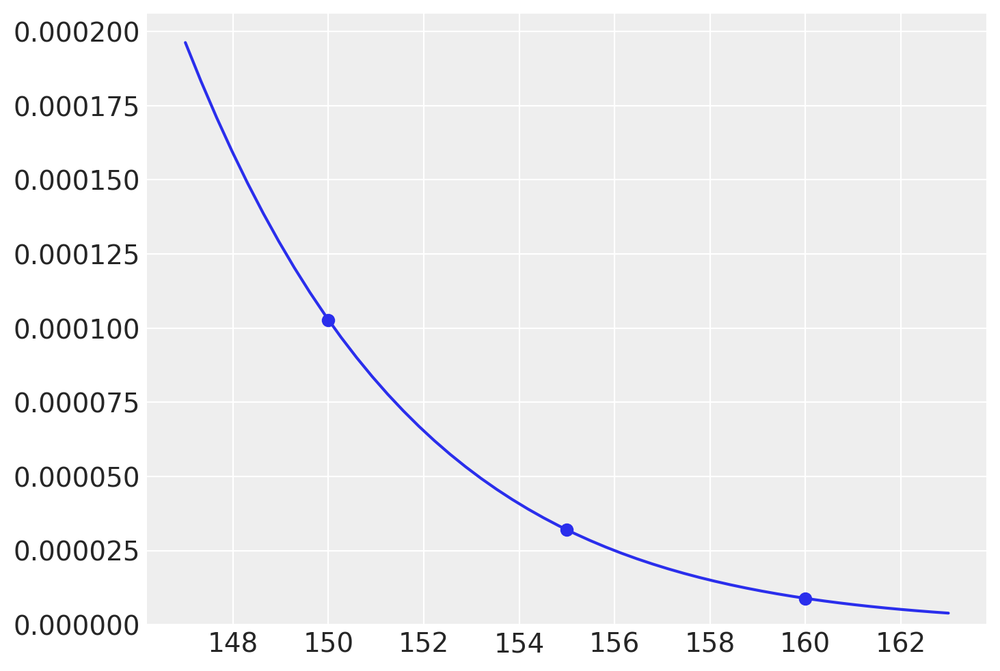

In [34]:
# x = np.linspace(50, 150, 100)
for origin_data in [[90, 95, 100], [105, 110, 115], [150, 155, 160]]:
    x = np.linspace(origin_data[0]-3, origin_data[-1]+3, 50)
    plt.plot(x, stats.norm.pdf(x, 100, 15), label="prior")
    max_y = stats.norm.pdf(x, 100, 15).max() * 1.05
    plt.scatter(origin_data, stats.norm.pdf(origin_data, 100, 15), color="C0", label="data")
    plt.ylim(0, max_y)
    plt.show()

#### Exercise 4.3.3

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mui, lambda1]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 33 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
"mui[0, 0]",94.981,0.713,93.569,96.298,0.013,0.009,3218.0,2130.0,1.0,94.979
"mui[1, 0]",109.982,0.719,108.595,111.271,0.013,0.009,3129.0,2444.0,1.0,109.981
"mui[2, 0]",154.992,0.673,153.646,156.225,0.012,0.008,3384.0,2081.0,1.0,154.990
lambda1,0.996,0.564,0.155,2.064,0.014,0.010,1590.0,1782.0,1.0,0.895
sg,1.143,0.388,0.578,1.819,0.010,0.007,1590.0,1782.0,1.0,1.057


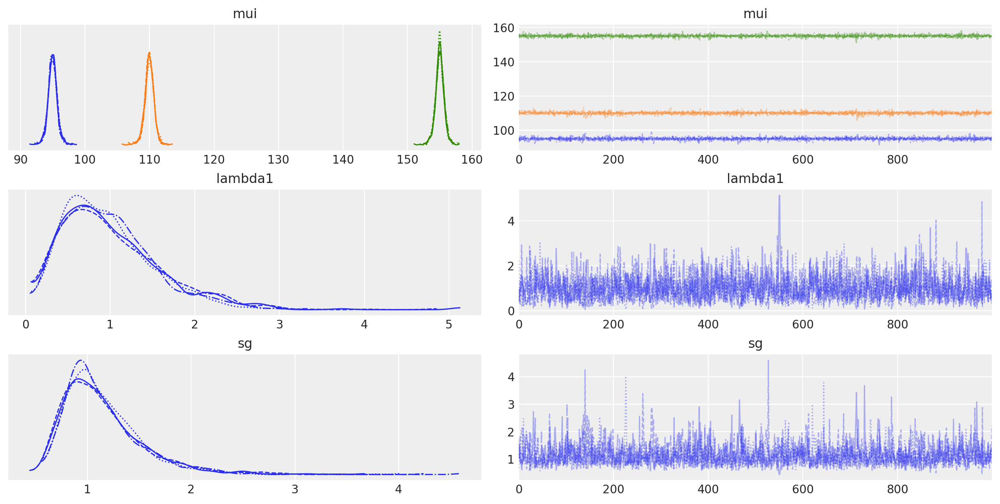

In [17]:
# Data
y = np.array([[94, 95, 96], [109, 110, 111], [154, 155, 156]])
ntest = 3
nsbj = 3

with pm.Model() as model3_3_1:
    # mu_i ~ Uniform(0, 300)
    # notices the shape here need to be properly
    # initualized to have the right repeated measure
    mui = pm.Uniform("mui", 0., 300., shape=(nsbj, 1)) # shape = (3, 1)

    # sg ~ Uniform(0, 100)
    # sg = pm.Uniform('sg', .0, 100)

    # It is more stable to use a Gamma prior
    lambda1 = pm.Gamma("lambda1", alpha=0.01, beta=0.01)
    sg = pm.Deterministic("sg", 1 / np.sqrt(lambda1))

    # y ~ Normal(mu_i, sg)
    yd = pm.Normal("y", mu=mui, sigma=sg, observed=y)

    trace3_3_1 = pm.sample(init="adapt_diag")

display(az.summary(trace3_3_1, stat_funcs={"median": np.median}))

az.plot_trace(trace3_3_1, compact=True);

In [18]:
# Data
y = np.array([[94, 95, 96], [109, 110, 111], [154, 155, 156]])
ntest = 3
nsbj = 3

with pm.Model() as model3_3_2:
    # mu_i ~ Uniform(0, 300)
    # notices the shape here need to be properly
    # initualized to have the right repeated measure
    mui = pm.Normal("mui", mu=100., sigma=15., shape=(nsbj, 1)) # shape = (3, 1)

    # sg ~ Uniform(0, 100)
    # sg = pm.Uniform('sg', .0, 100)

    # It is more stable to use a Gamma prior
    lambda1 = pm.Gamma("lambda1", alpha=0.01, beta=0.01)
    sg = pm.Deterministic("sg", 1 / np.sqrt(lambda1))

    # y ~ Normal(mu_i, sg)
    yd = pm.Normal("y", mu=mui, sigma=sg, observed=y)

    trace3_3_2 = pm.sample(init="adapt_diag")

display(az.summary(trace3_3_2, stat_funcs={"median": np.median}))

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mui, lambda1]


/opt/anaconda3/envs/mcmc/lib/python3.12/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 27 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
"mui[0, 0]",95.010,0.683,93.814,96.399,0.011,0.008,3802.0,2433.0,1.0,95.011
"mui[1, 0]",109.985,0.662,108.767,111.334,0.011,0.008,3604.0,2420.0,1.0,109.978
"mui[2, 0]",154.902,0.673,153.686,156.217,0.012,0.009,3149.0,2179.0,1.0,154.915
lambda1,1.030,0.598,0.129,2.112,0.015,0.011,1530.0,1734.0,1.0,0.899
sg,1.128,0.380,0.573,1.820,0.010,0.007,1530.0,1734.0,1.0,1.055


Mow different priors for $\mu$ result in almost the same posterior estimation. Because the data is "strong" enough to dominate the prior.

Solution for Reference:
> This happens because the data suggest that the test is very accurate, and accurate data are more robust against the prior.

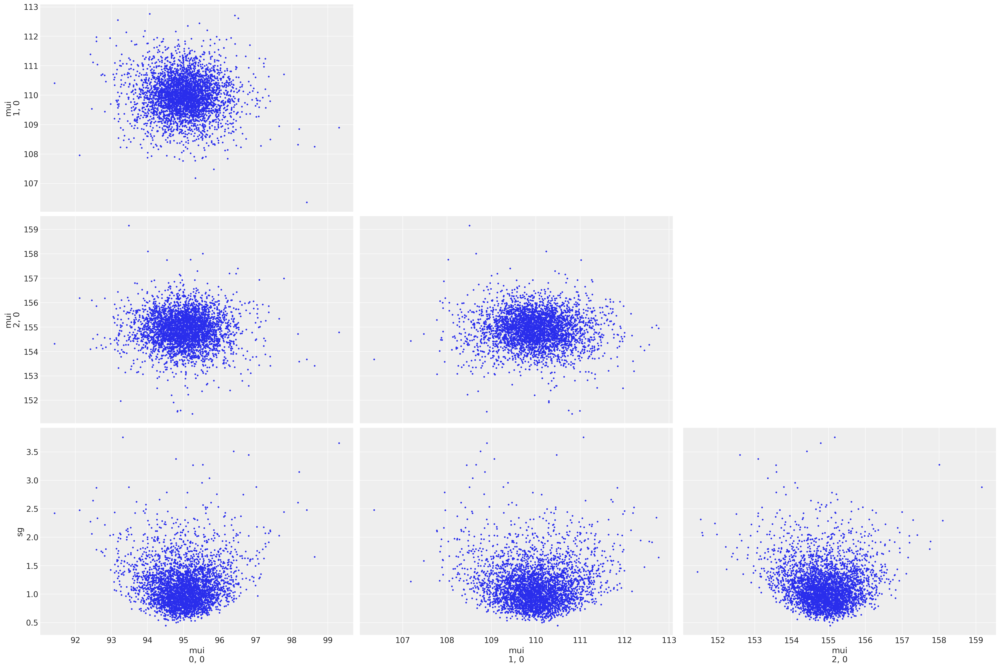

In [21]:
az.plot_pair(trace3_3_2, var_names=["mui", "sg"]);

In [35]:
%load_ext watermark
%watermark -n -u -v -iv -w

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
Last updated: Sat Oct 12 2024

Python implementation: CPython
Python version       : 3.12.7
IPython version      : 8.28.0

numpy     : 1.26.4
matplotlib: 3.9.2
scipy     : 1.12.0
arviz     : 0.17.1
pymc      : 5.16.1
seaborn   : 0.13.2

Watermark: 2.5.0

